In [53]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from transformers import AutoImageProcessor, AutoModelForImageClassification
from PIL import Image
import os
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
import pandas as pd

In [9]:
dir = "D:\\Projects\\FYP\\Datasets\\Small_Food"
train_data_dir = os.path.join(dir,'train')
test_data_dir =os.path.join(dir,'test')
val_data_dir = os.path.join(dir,'validation')

In [10]:
#pre-trained model
processor = AutoImageProcessor.from_pretrained("DrishtiSharma/finetuned-ViT-Indian-Food-Classification-v3")
model = AutoModelForImageClassification.from_pretrained("DrishtiSharma/finetuned-ViT-Indian-Food-Classification-v3")

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [11]:
num_classes = 23  # 23 classes in each train, test, and validation folder
model.classifier = torch.nn.Linear(in_features=model.classifier.in_features, out_features=num_classes)

In [12]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomHorizontalFlip(),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: torch.clamp(x, 0.0, 1.0))
])


In [13]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.classes = os.listdir(data_dir)
        self.class_to_idx = {class_name: i for i, class_name in enumerate(self.classes)}
        self.image_paths = []
        self.labels = []

        for class_name in self.classes:
            class_path = os.path.join(data_dir, class_name)
            class_idx = self.class_to_idx[class_name]
            for image_name in os.listdir(class_path):
                self.image_paths.append(os.path.join(class_path, image_name))
                self.labels.append(class_idx)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

In [14]:
train_dataset = CustomDataset(train_data_dir, transform=transform)
test_dataset = CustomDataset(test_data_dir, transform=transform)
val_dataset = CustomDataset(val_data_dir, transform=transform)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size)

In [15]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = torch.nn.CrossEntropyLoss()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


model.to(device)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

cuda


In [16]:
num_epochs = 4

In [17]:
# Training
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    
    for images, labels in train_loader:
        inputs = processor(images=images.to(device), return_tensors="pt", do_rescale=False).to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(**inputs)
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    scheduler.step()

    model.eval()
    val_running_loss = 0.0
    
    with torch.no_grad():
        for val_images, val_labels in val_loader:
            val_inputs = processor(images=val_images.to(device), return_tensors="pt", do_rescale=False).to(device)
            val_labels = val_labels.to(device)
            
            val_outputs = model(**val_inputs)
            val_loss = criterion(val_outputs.logits, val_labels)
            val_running_loss += val_loss.item()

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_val_loss = val_running_loss / len(val_loader.dataset)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss}, Validation Loss: {epoch_val_loss}")

Epoch [1/4], Loss: 0.04892665084956977, Validation Loss: 0.02182696239856953
Epoch [2/4], Loss: 0.01326260443811203, Validation Loss: 0.01278869948093442
Epoch [3/4], Loss: 0.007063600340458087, Validation Loss: 0.010860106851867021
Epoch [4/4], Loss: 0.004707327663741407, Validation Loss: 0.009649900345451837


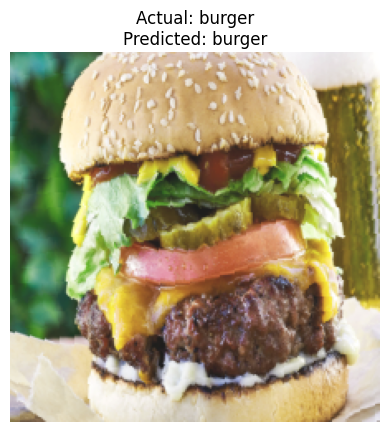

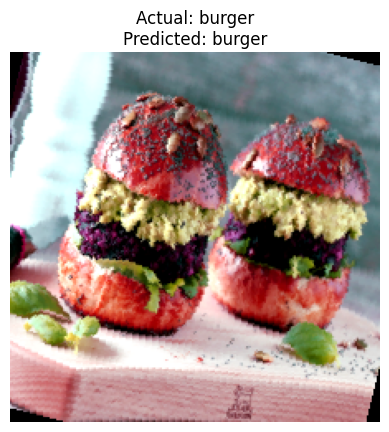

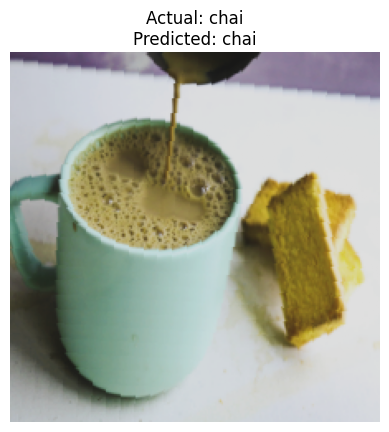

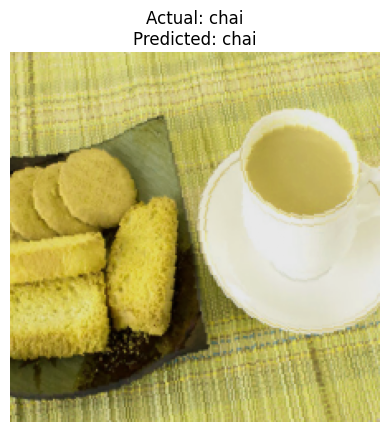

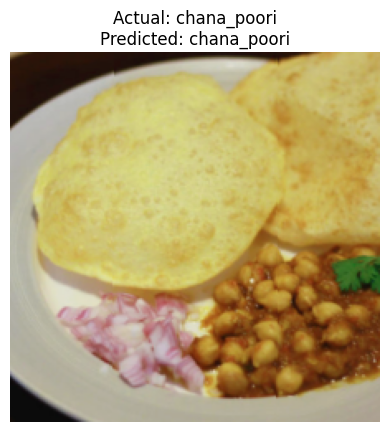

...

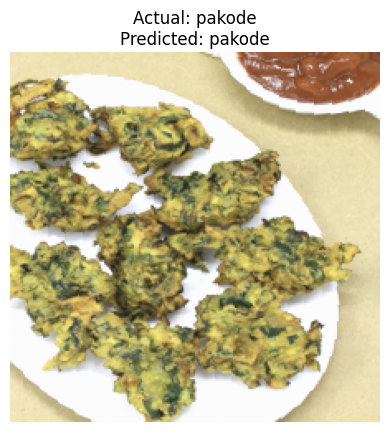

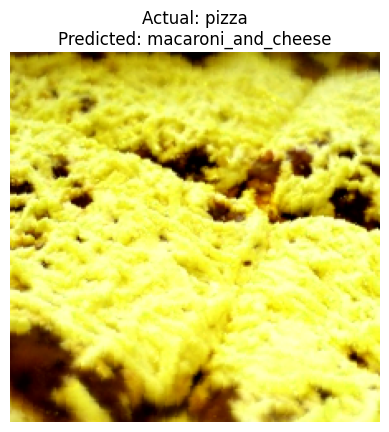

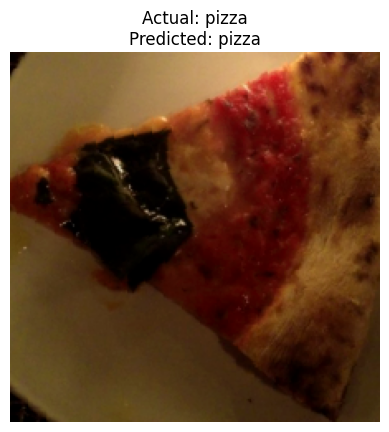

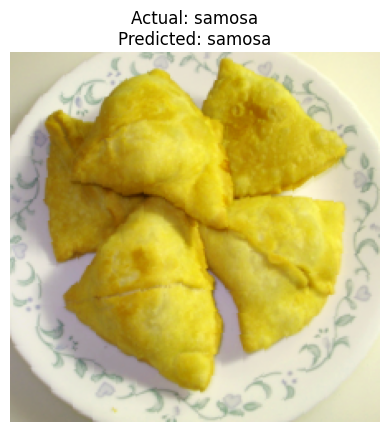

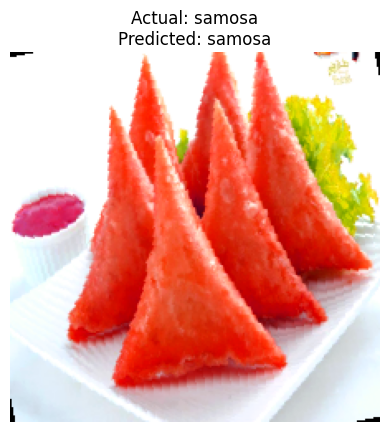

In [18]:
model.eval()
predictions = []
true_labels = []

class_displayed = {classname: 0 for classname in test_dataset.classes}

with torch.no_grad():
    for images, labels in test_loader:
        inputs = processor(images=images.to(device), return_tensors="pt", do_rescale=False)
        inputs = {key: val.to(device) for key, val in inputs.items()}
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_classes = torch.argmax(logits, dim=1)

        predictions.extend(predicted_classes.cpu().numpy())
        true_labels.extend(labels.numpy())

        for i in range(len(labels)):
            actual_class = test_dataset.classes[labels[i]]
            predicted_class = test_dataset.classes[predicted_classes[i]]

            if class_displayed[actual_class] < 2:
                img = images[i].permute(1, 2, 0).cpu().numpy()

                plt.imshow(img)
                plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}")
                plt.axis('off')
                plt.show()

                class_displayed[actual_class] += 1

            if all(count >= 2 for count in class_displayed.values()):
                break

In [19]:
accuracy = accuracy_score(true_labels, predictions)
class_report = classification_report(true_labels, predictions, target_names=test_dataset.classes)

# Display results
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(class_report)


Accuracy: 0.8985507246376812
Classification Report:
                     precision    recall  f1-score   support

             burger       0.97      1.00      0.99        36
               chai       1.00      0.97      0.99        36
        chana_poori       1.00      1.00      1.00        36
            chapati       0.95      0.97      0.96        36
      chicken_curry       0.76      0.86      0.81        36
      chicken_wings       0.74      0.97      0.84        36
      club_sandwich       0.94      0.89      0.91        36
          cup_cakes       0.92      0.94      0.93        36
        dal_makhani       1.00      0.92      0.96        36
       french_fries       0.92      0.94      0.93        36
         fried_rice       0.91      0.83      0.87        36
          ice_cream       0.83      0.83      0.83        36
             jalebi       0.92      1.00      0.96        36
       kadai_paneer       0.94      0.86      0.90        36
              kulfi       0.92  

In [20]:
model_save_path = "food_model.pth"
torch.save(model, model_save_path)

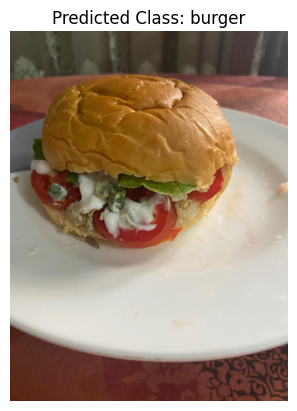

In [21]:
def predict_image_class(image_path, model, processor, transform, device):
    image = Image.open(image_path).convert('RGB')
    image = transform(image)
    image = image.unsqueeze(0).to(device) 
    inputs = processor(images=image, return_tensors="pt", do_rescale=False)
    inputs = {k: v.to(device) for k, v in inputs.items()}  
    
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_class_idx = torch.argmax(logits, dim=1).item()

    return predicted_class_idx

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

image_path = r"C:\Users\sarim\Downloads\burger.jpeg"  
predicted_class_idx = predict_image_class(image_path, model, processor, transform, device)

image = Image.open(image_path)
plt.imshow(image)
plt.title(f"Predicted Class: {train_dataset.classes[predicted_class_idx]}") 
plt.axis('off')
plt.show()
